In [1]:
import xarray as xr

file_path = "IMERG_earlyrun_30Jun1stjul2025_hourly.nc"
ds = xr.open_dataset(file_path)

print("=== Dataset Overview ===")
print(ds)

# Select precipitation variable explicitly
da = ds["precipitation"]

print("\n=== Precipitation Variable ===")
print(da)


=== Dataset Overview ===
<xarray.Dataset> Size: 6MB
Dimensions:        (time: 48, bnds: 2, lon: 200, lat: 160)
Coordinates:
  * time           (time) datetime64[ns] 384B 2025-06-30T00:15:00 ... 2025-07...
  * lon            (lon) float32 800B 70.05 70.15 70.25 ... 89.75 89.85 89.95
  * lat            (lat) float32 640B 20.05 20.15 20.25 ... 35.75 35.85 35.95
Dimensions without coordinates: bnds
Data variables:
    time_bnds      (time, bnds) datetime64[ns] 768B ...
    precipitation  (time, lat, lon) float32 6MB ...
Attributes:
    CDI:                                    Climate Data Interface version 2....
    Conventions:                            CF-1.6
    Original_Producer_Metadata_FileHeader:  DOI=10.5067/GPM/IMERG/3B-HH-L/07;...
    Original_Producer_Metadata_FileInfo:    DataFormatVersion=7e;\nTKCodeBuil...
    Original_Producer_Metadata_GridHeader:  BinMethod=ARITHMETIC_MEAN;\nRegis...
    InputPointer:                           3B-HHR-L.MS.MRG.3IMERG.20250601-S...
    histor

In [2]:
import numpy as np

print("\n=== Precipitation Statistics ===")
print(f"Shape (time, lat, lon): {da.shape}")
print(f"Time steps: {da.time.size}")
print(f"Start time: {str(da.time.values[0])}")
print(f"End time: {str(da.time.values[-1])}")
print(f"Min precipitation: {float(da.min())}")
print(f"Max precipitation: {float(da.max())}")
print(f"Mean precipitation: {float(da.mean())}")



=== Precipitation Statistics ===
Shape (time, lat, lon): (48, 160, 200)
Time steps: 48
Start time: 2025-06-30T00:15:00.000000000
End time: 2025-07-01T23:15:00.000000000
Min precipitation: 0.0
Max precipitation: 100.00999450683594
Mean precipitation: 0.48102426528930664


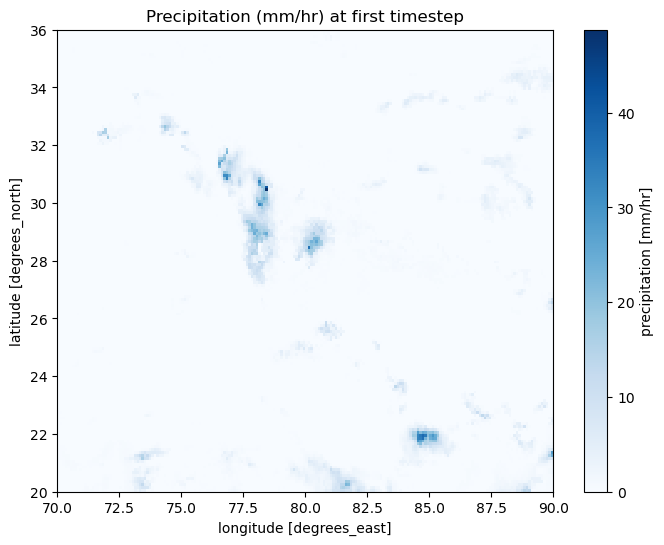

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
da.isel(time=0).plot(cmap="Blues")
plt.title("Precipitation (mm/hr) at first timestep")
plt.show()


In [4]:
import hvplot.xarray  # pip install hvplot

# Detect coordinate names explicitly
lat_name = "lat" if "lat" in ds.coords else "latitude"
lon_name = "lon" if "lon" in ds.coords else "longitude"

# Now make interactive map
da.isel(time=0).hvplot.quadmesh(
    x=lon_name, y=lat_name,
    cmap="Blues", geo=True, tiles="OSM",
    title="IMERG Precipitation at first timestep"
)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .QuadMesh.I :QuadMesh   [lon,lat]   (precipitation)

=== Subset Region Info ===
<xarray.DataArray 'precipitation' (time: 48, lat: 3, lon: 5)> Size: 3kB
[720 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 384B 2025-06-30T00:15:00 ... 2025-07-01T23...
  * lon      (lon) float32 20B 76.95 77.05 77.15 77.25 77.35
  * lat      (lat) float32 12B 31.45 31.55 31.65
Attributes:
    units:             mm/hr
    cell_methods:      time: sum
    DimensionNames:    time,lon,lat
    Units:             mm/hr
    CodeMissingValue:  -9999.9
    LongName:          \nComplete merged microwave-infrared (gauge-adjusted)\...

=== Precipitation Stats in Region ===
Time span: 2025-06-30T00:15:00.000000000 to 2025-07-01T23:15:00.000000000
Shape (time, lat, lon): (48, 3, 5)
Min precip (mm/hr): 0.0
Max precip (mm/hr): 36.98999786376953
Mean precip (mm/hr): 2.5672903060913086


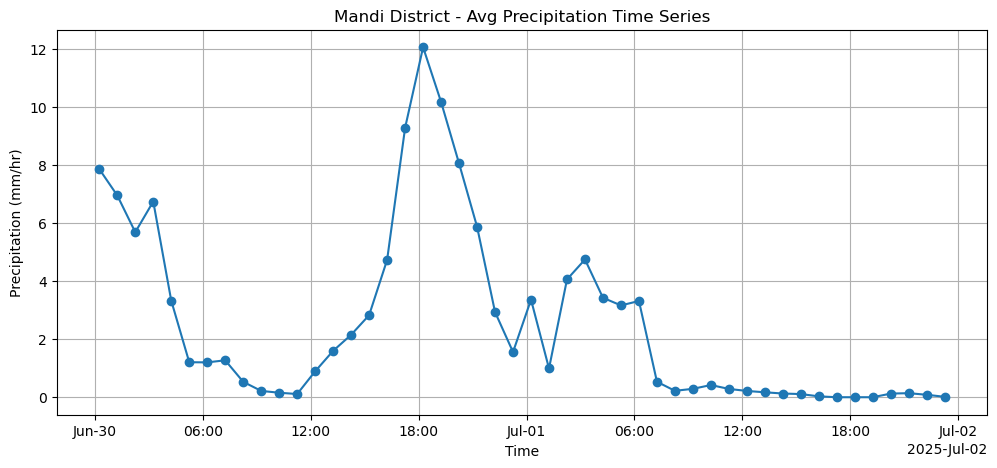

In [5]:
import xarray as xr

# Open dataset
ds = xr.open_dataset("IMERG_earlyrun_30Jun1stjul2025_hourly.nc")

# Extract main precipitation variable
da = ds["precipitation"]

# Bounding box (Mandi district)
lon_min, lon_max = 76.852633, 77.374026
lat_min, lat_max = 31.409162, 31.744549

# Subset region
da_sub = da.sel(
    lon=slice(lon_min, lon_max),
    lat=slice(lat_min, lat_max)
)

print("=== Subset Region Info ===")
print(da_sub)

# Basic stats
print("\n=== Precipitation Stats in Region ===")
print(f"Time span: {str(da_sub.time.values[0])} to {str(da_sub.time.values[-1])}")
print(f"Shape (time, lat, lon): {da_sub.shape}")

print(f"Min precip (mm/hr): {float(da_sub.min().values)}")
print(f"Max precip (mm/hr): {float(da_sub.max().values)}")
print(f"Mean precip (mm/hr): {float(da_sub.mean().values)}")

# Optional: plot time series of average precipitation over the region
import matplotlib.pyplot as plt

da_mean = da_sub.mean(dim=["lat", "lon"])  # average over region
da_mean.plot(marker="o", figsize=(12,5))
plt.title("Mandi District - Avg Precipitation Time Series")
plt.ylabel("Precipitation (mm/hr)")
plt.xlabel("Time")
plt.grid(True)
plt.show()


=== Subset Info ===
Subset shape (time, lat, lon): (48, 3, 5)
Lat size: 3, Lon size: 5
Total grid cells: 15


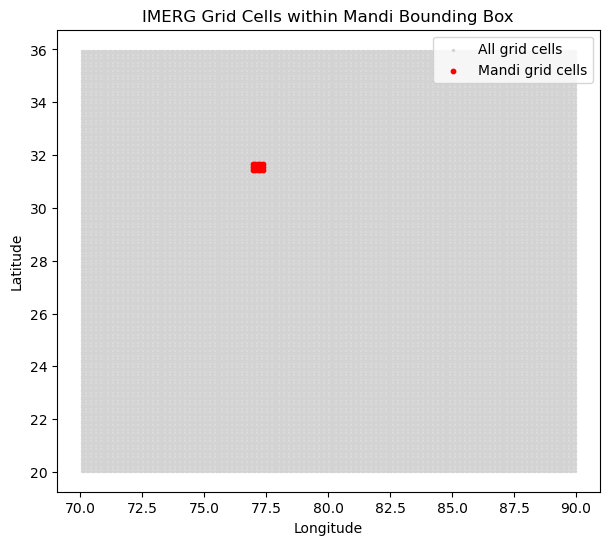

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Bounding box (Mandi district)
lon_min, lon_max = 76.852633, 77.374026
lat_min, lat_max = 31.409162, 31.744549

# Select grid cells within bounding box
subset = da.sel(
    lon=slice(lon_min, lon_max),
    lat=slice(lat_min, lat_max)
)

print("=== Subset Info ===")
print(f"Subset shape (time, lat, lon): {subset.shape}")
print(f"Lat size: {subset.lat.size}, Lon size: {subset.lon.size}")
print(f"Total grid cells: {subset.lat.size * subset.lon.size}")

# Create meshgrid for plotting all grid points
lon_all, lat_all = np.meshgrid(ds.lon.values, ds.lat.values)
lon_sub, lat_sub = np.meshgrid(subset.lon.values, subset.lat.values)

# Plot grid coverage
plt.figure(figsize=(7,6))
plt.scatter(lon_all, lat_all, s=2, color="lightgray", label="All grid cells")
plt.scatter(lon_sub, lat_sub, s=10, color="red", label="Mandi grid cells")
plt.title("IMERG Grid Cells within Mandi Bounding Box")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.show()


In [7]:
# Keep only Mandi bounding box data
da_mandi = da.sel(
    lon=slice(lon_min, lon_max),
    lat=slice(lat_min, lat_max)
)

print("\n=== Mandi Subset Statistics ===")
print(f"Shape (time, lat, lon): {da_mandi.shape}")
print(f"Lat range: {da_mandi.lat.values.min()} - {da_mandi.lat.values.max()}")
print(f"Lon range: {da_mandi.lon.values.min()} - {da_mandi.lon.values.max()}")

# Save to new NetCDF
out_file = "Mandi_Precipitation.nc"
da_mandi.to_netcdf(out_file)
print(f"\n✅ Saved subset NetCDF as {out_file}")



=== Mandi Subset Statistics ===
Shape (time, lat, lon): (48, 3, 5)
Lat range: 31.44999885559082 - 31.649999618530273
Lon range: 76.94999694824219 - 77.3499984741211

✅ Saved subset NetCDF as Mandi_Precipitation.nc


In [8]:
import hvplot.xarray  # already installed

# First timestep visualization
da_mandi.isel(time=0).hvplot.quadmesh(
    x="lon", y="lat",
    cmap="Blues", geo=True, tiles="OSM",
    title="IMERG Precipitation - Mandi Region (First timestep)"
)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .QuadMesh.I :QuadMesh   [lon,lat]   (precipitation)

In [9]:
import numpy as np
import pandas as pd

# Bounding box (Mandi district) — repeat for robustness
lon_min, lon_max = 76.852633, 77.374026
lat_min, lat_max = 31.409162, 31.744549

# Recreate the subset (safe if already exists)
da_mandi = da.sel(lon=slice(lon_min, lon_max), lat=slice(lat_min, lat_max))
print("=== Mandi Subset (for grid making) ===")
print(f"Shape (time, lat, lon): {da_mandi.shape}")
print(f"Lat size: {da_mandi.lat.size}, Lon size: {da_mandi.lon.size}")
print(f"Time steps: {da_mandi.time.size}\n")

latc = da_mandi.lat.values  # centers (ascending S->N)
lonc = da_mandi.lon.values  # centers (ascending W->E)
nlat, nlon = latc.size, lonc.size

def center_to_edges(centers: np.ndarray) -> np.ndarray:
    """Compute edges from 1D centers (handles non-perfect uniform spacing)."""
    diffs = np.diff(centers)
    first = centers[0] - diffs[0]/2
    last  = centers[-1] + diffs[-1]/2
    mids  = (centers[:-1] + centers[1:]) / 2
    return np.concatenate([[first], mids, [last]])

lon_edges = center_to_edges(lonc)
lat_edges = center_to_edges(latc)

# Report resolution (deg and approx km at mean latitude)
mean_lat = float(latc.mean()) if nlat > 0 else (lat_min + lat_max)/2
deg_dy = np.mean(np.diff(latc)) if nlat > 1 else np.nan
deg_dx = np.mean(np.diff(lonc)) if nlon > 1 else np.nan
km_per_deg_lat = 111.32
km_per_deg_lon = 111.32 * np.cos(np.deg2rad(mean_lat))
dx_km = float(deg_dx * km_per_deg_lon) if np.isfinite(deg_dx) else np.nan
dy_km = float(deg_dy * km_per_deg_lat) if np.isfinite(deg_dy) else np.nan

print("=== Grid Resolution ===")
print(f"dLon ≈ {deg_dx:.4f}°  (~{dx_km:.2f} km at {mean_lat:.2f}°N)")
print(f"dLat ≈ {deg_dy:.4f}°  (~{dy_km:.2f} km)")
print(f"Cells: {nlat} rows × {nlon} cols = {nlat*nlon}\n")

def row_index_to_letters(i: int) -> str:
    """
    0 -> 'a', 1 -> 'b', ... 25 -> 'z', 26 -> 'aa', 27 -> 'ab', ...
    """
    letters = []
    i2 = i
    while True:
        letters.append(chr(ord('a') + (i2 % 26)))
        i2 = i2 // 26 - 1
        if i2 < 0:
            break
    return ''.join(reversed(letters))

# Build grid index:
# rows labeled north->south: top row = 'a'
# columns labeled west->east: first column = 1
records = []
for r_north in range(nlat):
    i = nlat - 1 - r_north             # convert to array index (lat ascending S->N)
    row_label = row_index_to_letters(r_north)  # 'a', 'b', ...
    for j in range(nlon):
        col_num = j + 1
        cell_id = f"{row_label}{col_num}"      # e.g., a1, a2, b1, ...
        rec = {
            "cell_id": cell_id,
            "row_label": row_label,
            "row_north": r_north + 1,   # 1-based row index from north
            "col": col_num,             # 1-based col index from west
            "lat_center": float(latc[i]),
            "lon_center": float(lonc[j]),
            "lat_min": float(lat_edges[i]),
            "lat_max": float(lat_edges[i+1]),
            "lon_min": float(lon_edges[j]),
            "lon_max": float(lon_edges[j+1]),
        }
        records.append(rec)

grid_df = pd.DataFrame.from_records(records)
print("=== Grid Index Preview (top 10) ===")
print(grid_df.head(10).to_string(index=False))

# Save for QA/reference
grid_df.to_csv("Mandi_grid_index.csv", index=False)
print("\n✅ Saved grid index table -> Mandi_grid_index.csv")


=== Mandi Subset (for grid making) ===
Shape (time, lat, lon): (48, 3, 5)
Lat size: 3, Lon size: 5
Time steps: 48

=== Grid Resolution ===
dLon ≈ 0.1000°  (~9.49 km at 31.55°N)
dLat ≈ 0.1000°  (~11.13 km)
Cells: 3 rows × 5 cols = 15

=== Grid Index Preview (top 10) ===
cell_id row_label  row_north  col  lat_center  lon_center   lat_min   lat_max   lon_min   lon_max
     a1         a          1    1   31.650000   76.949997 31.599998 31.700000 76.899998 77.000000
     a2         a          1    2   31.650000   77.049995 31.599998 31.700000 77.000000 77.099998
     a3         a          1    3   31.650000   77.150002 31.599998 31.700000 77.099998 77.199997
     a4         a          1    4   31.650000   77.250000 31.599998 31.700000 77.199997 77.300003
     a5         a          1    5   31.650000   77.349998 31.599998 31.700000 77.300003 77.399998
     b1         b          2    1   31.549999   76.949997 31.500000 31.599998 76.899998 77.000000
     b2         b          2    2   31.54999

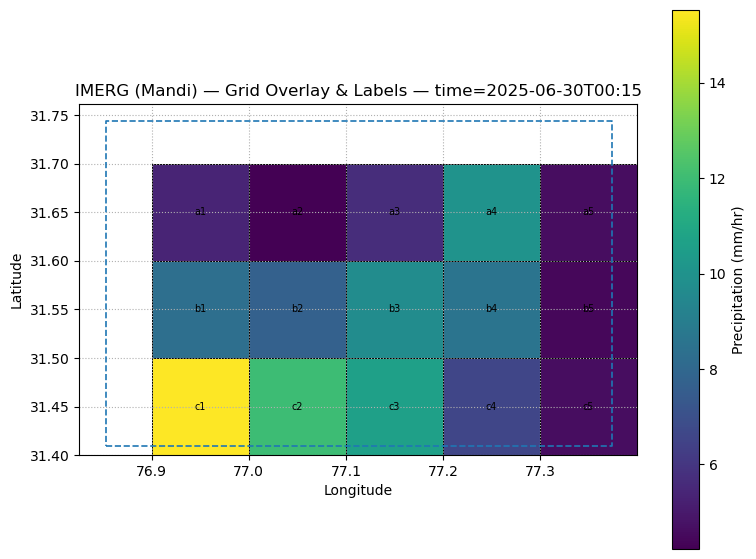

In [10]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Choose a timestep to visualize
t_idx = 0  # first timestep
Z = da_mandi.isel(time=t_idx).values

fig, ax = plt.subplots(figsize=(9, 7))

# Background raster using cell edges so the pixmap aligns perfectly
pcm = ax.pcolormesh(lon_edges, lat_edges, Z, shading='auto')
cb = fig.colorbar(pcm, ax=ax, label="Precipitation (mm/hr)")
ax.set_title(f"IMERG (Mandi) — Grid Overlay & Labels — time={np.datetime_as_string(da_mandi.time.values[t_idx], unit='m')}")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

# Draw each cell rectangle + label
show_labels = True
for rec in records:
    w = rec["lon_max"] - rec["lon_min"]
    h = rec["lat_max"] - rec["lat_min"]
    rect = Rectangle(
        (rec["lon_min"], rec["lat_min"]),
        w, h,
        fill=False, linewidth=0.7
    )
    ax.add_patch(rect)
    if show_labels:
        ax.text(rec["lon_center"], rec["lat_center"], rec["cell_id"],
                ha="center", va="center", fontsize=7)

# Draw the bounding box (optional visual check)
ax.plot([lon_min, lon_max, lon_max, lon_min, lon_min],
        [lat_min, lat_min, lat_max, lat_max, lat_min],
        linestyle="--", linewidth=1.2)

ax.set_aspect('equal', adjustable='box')
ax.grid(True, linestyle=":")
plt.show()


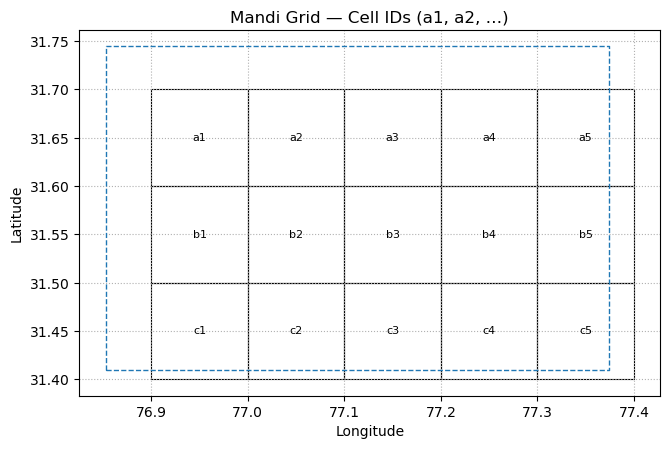

=== QA Checks ===
North-west cell: a1
South-east cell: c5
Unique IDs: 15 (should be 15)


In [11]:
fig, ax = plt.subplots(figsize=(7.5, 7))

# Grid-only outlines
for rec in records:
    w = rec["lon_max"] - rec["lon_min"]
    h = rec["lat_max"] - rec["lat_min"]
    ax.add_patch(Rectangle((rec["lon_min"], rec["lat_min"]), w, h,
                           fill=False, linewidth=0.8))
    ax.text(rec["lon_center"], rec["lat_center"], rec["cell_id"],
            ha="center", va="center", fontsize=8)

# Bounding box outline
ax.plot([lon_min, lon_max, lon_max, lon_min, lon_min],
        [lat_min, lat_min, lat_max, lat_max, lat_min],
        linestyle="--", linewidth=1)

ax.set_title("Mandi Grid — Cell IDs (a1, a2, …)")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_aspect('equal', adjustable='box')
ax.grid(True, linestyle=":")
plt.show()

print("=== QA Checks ===")
print(f"North-west cell: {grid_df.sort_values(['row_north','col']).iloc[0]['cell_id']}")
print(f"South-east cell: {grid_df.sort_values(['row_north','col']).iloc[-1]['cell_id']}")
print(f"Unique IDs: {grid_df['cell_id'].nunique()} (should be {nlat*nlon})")


In [12]:
try:
    import geopandas as gpd
    from shapely.geometry import box
    import hvplot.pandas  # noqa: F401 (registers .hvplot)

    # Create polygon geometry per cell
    gdf = gpd.GeoDataFrame(
        grid_df.copy(),
        geometry=[box(r["lon_min"], r["lat_min"], r["lon_max"], r["lat_max"]) for r in records],
        crs="EPSG:4326"
    )

    # Save a GeoJSON (handy for GIS)
    gdf.to_file("Mandi_grid_index.geojson", driver="GeoJSON")
    print("✅ Saved polygons -> Mandi_grid_index.geojson")

    # Interactive layer: polygons + hover + optional labels
    poly = gdf.hvplot(geo=True, tiles="OSM", alpha=0.15, line_width=1,
                      hover_cols=["cell_id","row_label","row_north","col",
                                  "lat_center","lon_center"],
                      title="Mandi Grid (interactive) — hover to see cell_id")
    try:
        # Try text labels at centers (can be heavy if many cells)
        labels = gdf.hvplot.labels(x="lon_center", y="lat_center",
                                   text="cell_id", text_font_size="7pt")
        poly * labels
    except Exception:
        # Fallback: just polygons (hover has cell_id)
        poly
except Exception as e:
    print("Interactive map skipped — install geopandas & shapely if needed.")
    print("Reason:", e)


✅ Saved polygons -> Mandi_grid_index.geojson


In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) Basic checks
print("=== Sanity checks ===")
print("Subset shape (time, lat, lon):", da_mandi.shape)
assert da_mandi.time.size == 48, "Expected 48 time steps (2 days * 24)."
nlat, nlon = da_mandi.lat.size, da_mandi.lon.size
print(f"Grid cells: {nlat} rows × {nlon} cols = {nlat*nlon}\n")

# 2) Build a map: cell_id -> (i_lat, j_lon)
#    We recorded 'row_north' (1..nlat), 'col' (1..nlon) in `records`.
#    Convert row_north (north->south) to array index i (south->north ascending).
cell_index = {}
for rec in records:
    r_north_1based = rec["row_north"]
    c_west_1based  = rec["col"]
    i = nlat - r_north_1based          # array index for lat (0..nlat-1)
    j = c_west_1based - 1              # array index for lon (0..nlon-1)
    cell_index[rec["cell_id"]] = (i, j)

print("=== Cell index mapping (first few) ===")
for k in sorted(cell_index.keys())[:5]:
    print(k, "->", cell_index[k])

# 3) Handle missing values (per metadata)
missing_val = da.attrs.get("CodeMissingValue", -9999.9)
da_mandi_masked = da_mandi.where(da_mandi != missing_val)


=== Sanity checks ===
Subset shape (time, lat, lon): (48, 3, 5)
Grid cells: 3 rows × 5 cols = 15

=== Cell index mapping (first few) ===
a1 -> (2, 0)
a2 -> (2, 1)
a3 -> (2, 2)
a4 -> (2, 3)
a5 -> (2, 4)


In [14]:
print("\n=== Building per-cell time series (48 timestamps each) ===")

time_vals = da_mandi_masked.time.values
cell_ids = sorted(cell_index.keys(), key=lambda x: (len(''.join([c for c in x if c.isalpha()])),
                                                    ''.join([c for c in x if c.isalpha()]),
                                                    int(''.join([c for c in x if c.isdigit()]))))

series_dict = {}           # cell_id -> 1D np.array (length 48)
rows_long = []             # for a long DataFrame

for cid in cell_ids:
    i, j = cell_index[cid]
    ts = da_mandi_masked.isel(lat=i, lon=j).values  # shape (time,)
    series_dict[cid] = ts
    for t_idx, t in enumerate(time_vals):
        rows_long.append({"time": np.datetime_as_string(t, unit="m"),
                          "cell_id": cid,
                          "precip_mm_hr": float(ts[t_idx])})

ts_long = pd.DataFrame(rows_long)
print(ts_long.head(10).to_string(index=False))

# Save the long table
ts_long.to_csv("Mandi_cell_timeseries_long.csv", index=False)
print("\n✅ Saved time series (long) -> Mandi_cell_timeseries_long.csv")



=== Building per-cell time series (48 timestamps each) ===
            time cell_id  precip_mm_hr
2025-06-30T00:15      a1          5.36
2025-06-30T01:15      a1          2.15
2025-06-30T02:15      a1          0.13
2025-06-30T03:15      a1          0.32
2025-06-30T04:15      a1          1.36
2025-06-30T05:15      a1          1.31
2025-06-30T06:15      a1          1.07
2025-06-30T07:15      a1          0.97
2025-06-30T08:15      a1          0.45
2025-06-30T09:15      a1          0.28

✅ Saved time series (long) -> Mandi_cell_timeseries_long.csv


In [15]:
print("\n=== Totals per cell ===")

summary_rows = []
for cid, ts in series_dict.items():
    ts = np.array(ts, dtype=float)
    # Replace NaNs with 0 for sums (if any missing values exist)
    ts_clean = np.nan_to_num(ts, nan=0.0)

    total_48 = ts_clean.sum()
    day1_sum = ts_clean[:24].sum()
    day2_sum = ts_clean[24:48].sum()

    summary_rows.append({
        "cell_id": cid,
        "total_48h_mm": total_48,
        "day1_first24h_mm": day1_sum,
        "day2_next24h_mm": day2_sum
    })

summary_df = pd.DataFrame(summary_rows).sort_values("cell_id")
print(summary_df.to_string(index=False))

# Save
summary_df.to_csv("Mandi_cell_totals_48h.csv", index=False)
print("\n✅ Saved totals -> Mandi_cell_totals_48h.csv")



=== Totals per cell ===
cell_id  total_48h_mm  day1_first24h_mm  day2_next24h_mm
     a1    110.229999         43.719999        66.510000
     a2     48.589999         36.899999        11.690000
     a3     75.669998         57.199999        18.470000
     a4     97.370000         90.400000         6.970000
     a5     35.169999         31.729999         3.440000
     b1    144.829994         80.479997        64.349997
     b2     74.709998         54.289999        20.420000
     b3    130.039997        115.109997        14.930000
     b4    169.789994        163.519994         6.270000
     b5    106.349997        101.069997         5.280000
     c1    185.929997        101.749998        84.179998
     c2    129.819997         97.529998        32.289999
     c3    157.169995        127.469996        29.699999
     c4    225.969993        211.829993        14.140000
     c5    156.809995        148.029996         8.780000

✅ Saved totals -> Mandi_cell_totals_48h.csv



=== Plotting small-multiples time series (3×5) ===


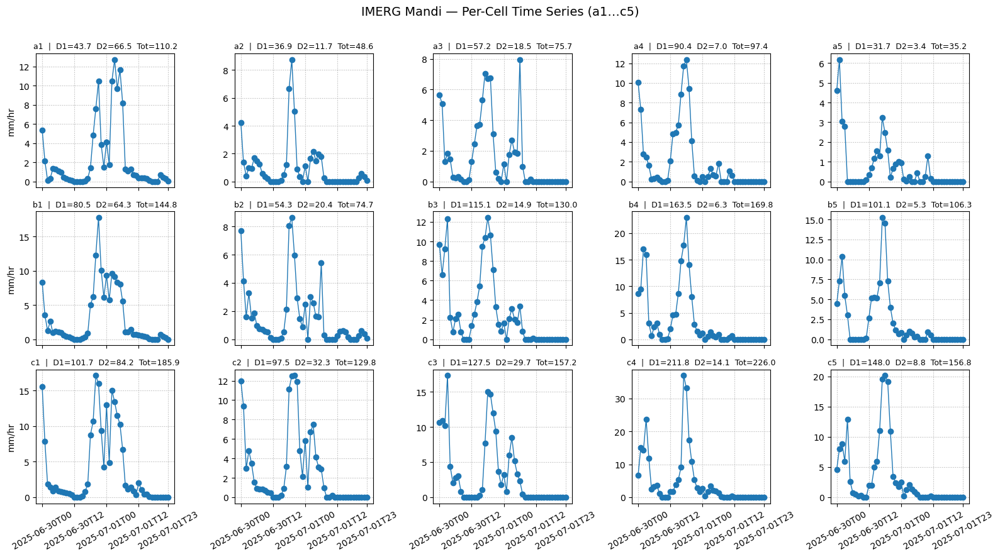

In [16]:
print("\n=== Plotting small-multiples time series (3×5) ===")

# Sort cells row-wise (a.., b.., c..) and within each row by column number
def row_label(cid): return ''.join([c for c in cid if c.isalpha()])
def col_num(cid):   return int(''.join([c for c in cid if c.isdigit()]))

rows = sorted(set(map(row_label, cell_ids)))         # ['a','b','c']
cols = sorted(set(map(col_num, cell_ids)))           # [1,2,3,4,5]

fig, axes = plt.subplots(nrows=len(rows), ncols=len(cols), figsize=(16, 9), sharex=True, sharey=False)
if len(rows) == 1:
    axes = np.array([axes])  # ensure 2D

for r_i, rlab in enumerate(rows):
    for c_i, c in enumerate(cols):
        ax = axes[r_i, c_i]
        cid = f"{rlab}{c}"
        ts = np.array(series_dict[cid], dtype=float)
        ts_clean = np.nan_to_num(ts, nan=0.0)

        # x-axis: use the actual time array
        tstr = [np.datetime_as_string(t, unit="h") for t in time_vals]  # hour precision for neat ticks
        ax.plot(tstr, ts_clean, marker='o', linewidth=1)

        # Titles with sums
        d1 = ts_clean[:24].sum()
        d2 = ts_clean[24:48].sum()
        tot = ts_clean.sum()
        ax.set_title(f"{cid}  |  D1={d1:.1f}  D2={d2:.1f}  Tot={tot:.1f}", fontsize=9)

        # Formatting
        ax.grid(True, linestyle=":")
        if r_i == len(rows)-1:
            ax.set_xticks([tstr[0], tstr[12], tstr[24], tstr[36], tstr[-1]])
            ax.set_xticklabels([tstr[0], tstr[12], tstr[24], tstr[36], tstr[-1]], rotation=30)
        else:
            ax.set_xticklabels([])
        if c_i == 0:
            ax.set_ylabel("mm/hr")

fig.suptitle("IMERG Mandi — Per-Cell Time Series (a1…c5)", fontsize=14)
fig.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()



=== Plotting bar charts of totals ===


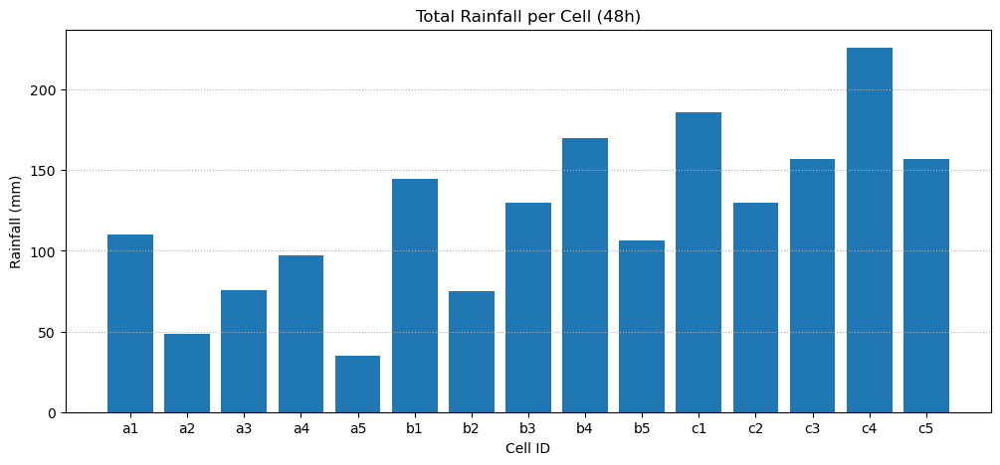

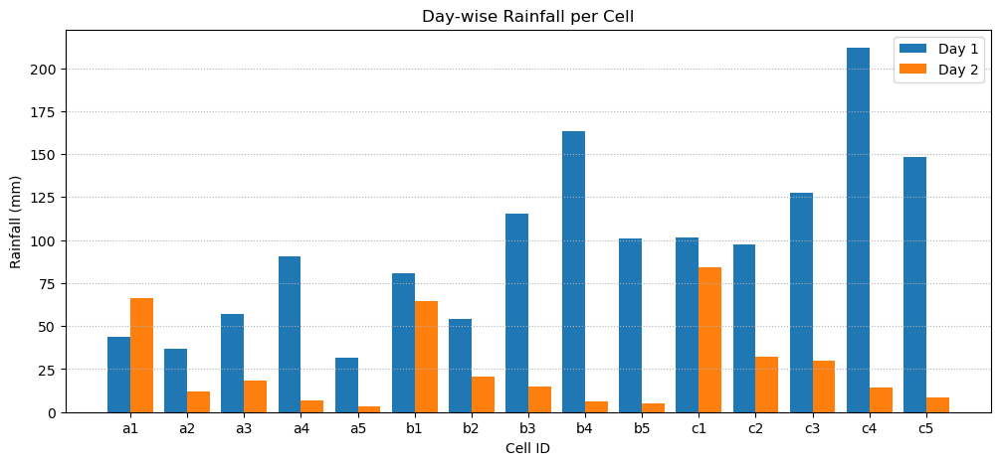

In [17]:
print("\n=== Plotting bar charts of totals ===")

# (a) 48-hour total per cell
fig, ax = plt.subplots(figsize=(12, 5))
ax.bar(summary_df["cell_id"], summary_df["total_48h_mm"])
ax.set_title("Total Rainfall per Cell (48h)")
ax.set_xlabel("Cell ID")
ax.set_ylabel("Rainfall (mm)")
ax.grid(True, axis='y', linestyle=":")
plt.show()

# (b) Day-1 vs Day-2 per cell
fig, ax = plt.subplots(figsize=(12, 5))
x = np.arange(len(summary_df))
w = 0.4
ax.bar(x - w/2, summary_df["day1_first24h_mm"], width=w, label="Day 1")
ax.bar(x + w/2, summary_df["day2_next24h_mm"],  width=w, label="Day 2")
ax.set_xticks(x)
ax.set_xticklabels(summary_df["cell_id"])
ax.set_title("Day-wise Rainfall per Cell")
ax.set_xlabel("Cell ID")
ax.set_ylabel("Rainfall (mm)")
ax.legend()
ax.grid(True, axis='y', linestyle=":")
plt.show()


In [18]:
import matplotlib.pyplot as plt
import numpy as np
import shapely.geometry as geom
from shapely.ops import unary_union

print("\n=== Step 1: Defining bounding box of Thunag region ===")
lon_min, lat_min = 77.161956, 31.551969
lon_max, lat_max = 77.175989, 31.562025
print(f"Bounding Box: Lon [{lon_min}, {lon_max}]  Lat [{lat_min}, {lat_max}]")



=== Step 1: Defining bounding box of Thunag region ===
Bounding Box: Lon [77.161956, 77.175989]  Lat [31.551969, 31.562025]


In [19]:
import shapely.geometry as geom

print("\n=== Step 2: Constructing polygons for each IMERG cell from records ===")
cell_polygons = {}

for rec in records:
    cid = rec["cell_id"]
    lon0, lon1 = rec["lon_min"], rec["lon_max"]
    lat0, lat1 = rec["lat_min"], rec["lat_max"]

    # Construct polygon
    poly = geom.Polygon([
        (lon0, lat0),
        (lon1, lat0),
        (lon1, lat1),
        (lon0, lat1)
    ])
    cell_polygons[cid] = poly

print(f"Total {len(cell_polygons)} cell polygons constructed.")



=== Step 2: Constructing polygons for each IMERG cell from records ===
Total 15 cell polygons constructed.


In [20]:
print("\n=== Step 3: Creating Thunag bounding box polygon ===")
bbox_poly = geom.Polygon([
    (lon_min,lat_min),
    (lon_max,lat_min),
    (lon_max,lat_max),
    (lon_min,lat_max)
])



=== Step 3: Creating Thunag bounding box polygon ===


In [21]:
print("\n=== Step 4: Checking overlaps ===")
overlapping_cells = []
for cid, poly in cell_polygons.items():
    if poly.intersects(bbox_poly):
        overlapping_cells.append(cid)

print(f"Overlapping cells with Thunag bounding box: {overlapping_cells}")



=== Step 4: Checking overlaps ===
Overlapping cells with Thunag bounding box: ['b3']



=== Step 5: Visualizing Grid + Bounding Box ===


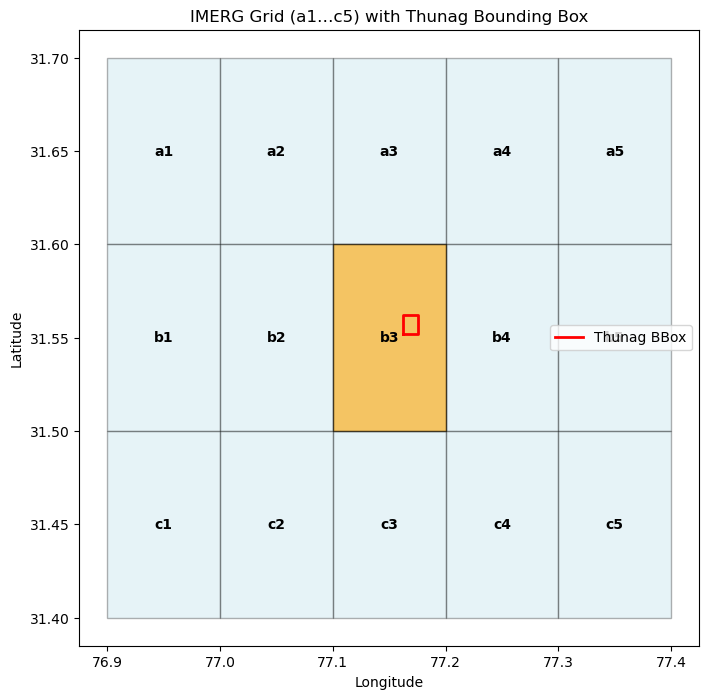

In [22]:
print("\n=== Step 5: Visualizing Grid + Bounding Box ===")
fig, ax = plt.subplots(figsize=(8,8))

# Draw each cell polygon
for cid, poly in cell_polygons.items():
    x,y = poly.exterior.xy
    ax.fill(x, y, edgecolor="black", facecolor="lightblue", alpha=0.3)
    cx, cy = poly.centroid.x, poly.centroid.y
    ax.text(cx, cy, cid, ha="center", va="center", fontsize=10, fontweight="bold")

# Highlight overlapping cells in orange
for cid in overlapping_cells:
    poly = cell_polygons[cid]
    x,y = poly.exterior.xy
    ax.fill(x, y, edgecolor="black", facecolor="orange", alpha=0.6)

# Draw bounding box in red
x,y = bbox_poly.exterior.xy
ax.plot(x,y, color="red", linewidth=2, label="Thunag BBox")

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("IMERG Grid (a1…c5) with Thunag Bounding Box")
ax.legend()
plt.show()



=== Step 6: Time series of overlapping cells ===
Cell b3 → Day1=115.1, Day2=14.9, Total=130.0


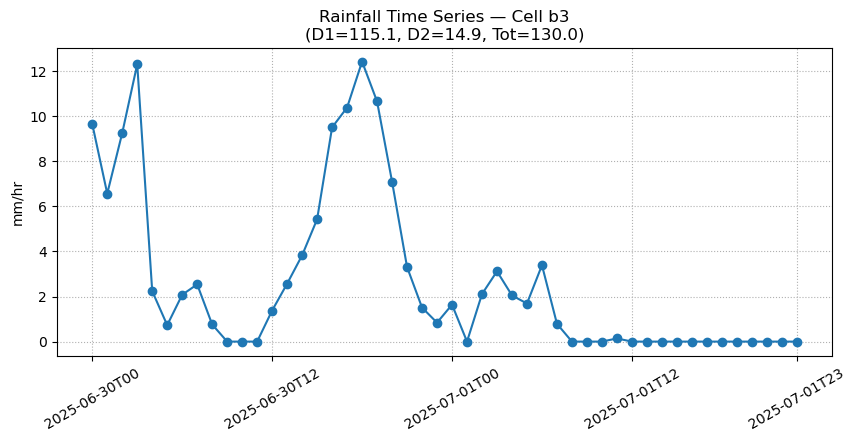

In [23]:
print("\n=== Step 6: Time series of overlapping cells ===")
for cid in overlapping_cells:
    ts = np.array(series_dict[cid], dtype=float)
    ts_clean = np.nan_to_num(ts, nan=0.0)
    
    d1, d2, tot = ts_clean[:24].sum(), ts_clean[24:48].sum(), ts_clean.sum()
    print(f"Cell {cid} → Day1={d1:.1f}, Day2={d2:.1f}, Total={tot:.1f}")
    
    # Plot time series
    plt.figure(figsize=(10,4))
    tstr = [np.datetime_as_string(t, unit="h") for t in time_vals]
    plt.plot(tstr, ts_clean, marker="o", linewidth=1.5)
    plt.xticks([tstr[0], tstr[12], tstr[24], tstr[36], tstr[-1]], rotation=30)
    plt.title(f"Rainfall Time Series — Cell {cid}\n(D1={d1:.1f}, D2={d2:.1f}, Tot={tot:.1f})")
    plt.grid(True, linestyle=":")
    plt.ylabel("mm/hr")
    plt.show()


In [24]:
import pandas as pd

print("\n=== Step 7: Exporting precipitation data of overlapping cell(s) to CSV ===")

# Example: suppose you already have the list of overlapping cell IDs
# from step 6 as: overlapping_cells = ["b2", "b3"]
# If it's just one, it will still work fine
print(f"Overlapping cell(s): {overlapping_cells}")

# Collect time series for each overlapping cell
rows = []
for cid in overlapping_cells:
    ts = np.array(series_dict[cid], dtype=float)
    ts_clean = np.nan_to_num(ts, nan=0.0)
    for t, val in zip(time_vals, ts_clean):
        rows.append({
            "time": pd.to_datetime(str(t)),  # convert np.datetime64 to pandas Timestamp
            "cell_id": cid,
            "precip_mm_hr": val
        })

# Convert to DataFrame
df_out = pd.DataFrame(rows)

# Save to CSV
csv_filename = "Thunag_overlapping_cells_precip.csv"
df_out.to_csv(csv_filename, index=False)

print(f"✅ Exported {len(df_out)} rows to {csv_filename}")



=== Step 7: Exporting precipitation data of overlapping cell(s) to CSV ===
Overlapping cell(s): ['b3']
✅ Exported 48 rows to Thunag_overlapping_cells_precip.csv



=== Step 8: Detecting Cloudburst Events (>=100 mm/day) ===
   cell_id     Day1_mm    Day2_mm  Cloudburst_D1  Cloudburst_D2  \
0       a1   43.719999  66.510000          False          False   
1       a2   36.899999  11.690000          False          False   
2       a3   57.199999  18.470000          False          False   
3       a4   90.400000   6.970000          False          False   
4       a5   31.729999   3.440000          False          False   
5       b1   80.479997  64.349997          False          False   
6       b2   54.289999  20.420000          False          False   
7       b3  115.109997  14.930000           True          False   
8       b4  163.519994   6.270000           True          False   
9       b5  101.069997   5.280000           True          False   
10      c1  101.749998  84.179998           True          False   
11      c2   97.529998  32.289999          False          False   
12      c3  127.469996  29.699999           True          False   
13

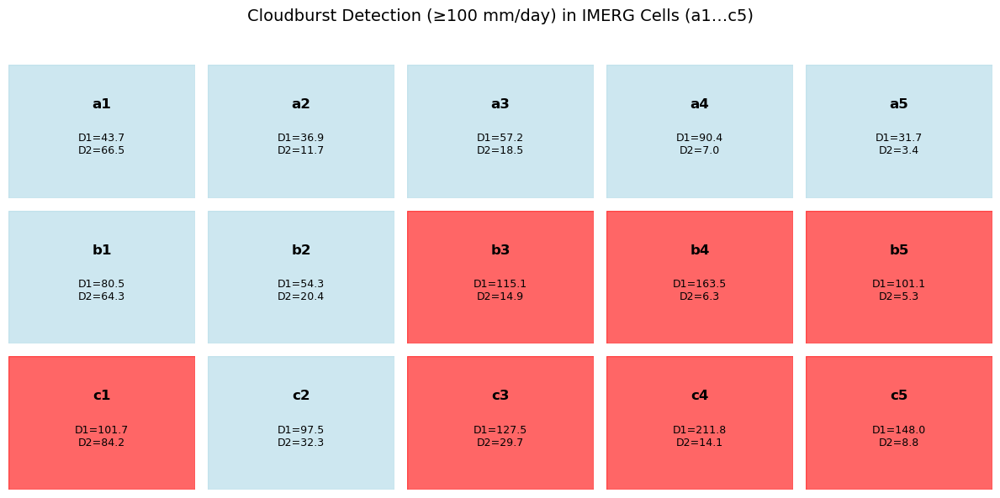

In [25]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

print("\n=== Step 8: Detecting Cloudburst Events (>=100 mm/day) ===")

results = []
for cid, ts in series_dict.items():
    ts_clean = np.nan_to_num(np.array(ts, dtype=float), nan=0.0)

    d1_sum = ts_clean[:24].sum()
    d2_sum = ts_clean[24:48].sum()

    cloudburst_d1 = d1_sum >= 100
    cloudburst_d2 = d2_sum >= 100
    any_cloudburst = cloudburst_d1 or cloudburst_d2

    results.append({
        "cell_id": cid,
        "Day1_mm": d1_sum,
        "Day2_mm": d2_sum,
        "Cloudburst_D1": cloudburst_d1,
        "Cloudburst_D2": cloudburst_d2,
        "Any_Cloudburst": any_cloudburst
    })

# Convert to DataFrame
df_cloudburst = pd.DataFrame(results)
print(df_cloudburst)

# === Visualization as 3×5 Grid ===
rows = sorted(set([c[0] for c in df_cloudburst["cell_id"]]))  # ['a','b','c']
cols = sorted(set([int(c[1:]) for c in df_cloudburst["cell_id"]]))  # [1..5]

fig, axes = plt.subplots(nrows=len(rows), ncols=len(cols), figsize=(12, 6))
if len(rows) == 1:
    axes = np.array([axes])  # ensure 2D array

for r_i, rlab in enumerate(rows):
    for c_i, c in enumerate(cols):
        ax = axes[r_i, c_i]
        cid = f"{rlab}{c}"
        rec = df_cloudburst[df_cloudburst["cell_id"] == cid].iloc[0]

        # Choose color
        if rec["Any_Cloudburst"]:
            facecolor = "red"   # Cloudburst detected
        else:
            facecolor = "lightblue"  # No cloudburst

        ax.add_patch(plt.Rectangle((0, 0), 1, 1, color=facecolor, alpha=0.6))
        ax.set_xlim(0, 1); ax.set_ylim(0, 1)
        ax.axis("off")

        # Annotate with ID and rainfall totals
        ax.text(0.5, 0.7, cid, ha="center", va="center", fontsize=12, weight="bold")
        ax.text(0.5, 0.4, f"D1={rec['Day1_mm']:.1f}\nD2={rec['Day2_mm']:.1f}",
                ha="center", va="center", fontsize=9)

fig.suptitle("Cloudburst Detection (≥100 mm/day) in IMERG Cells (a1…c5)", fontsize=14)
plt.tight_layout(rect=[0,0,1,0.95])
plt.show()


In [26]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots


=== Step 9: Creating Interactive Dashboard ===


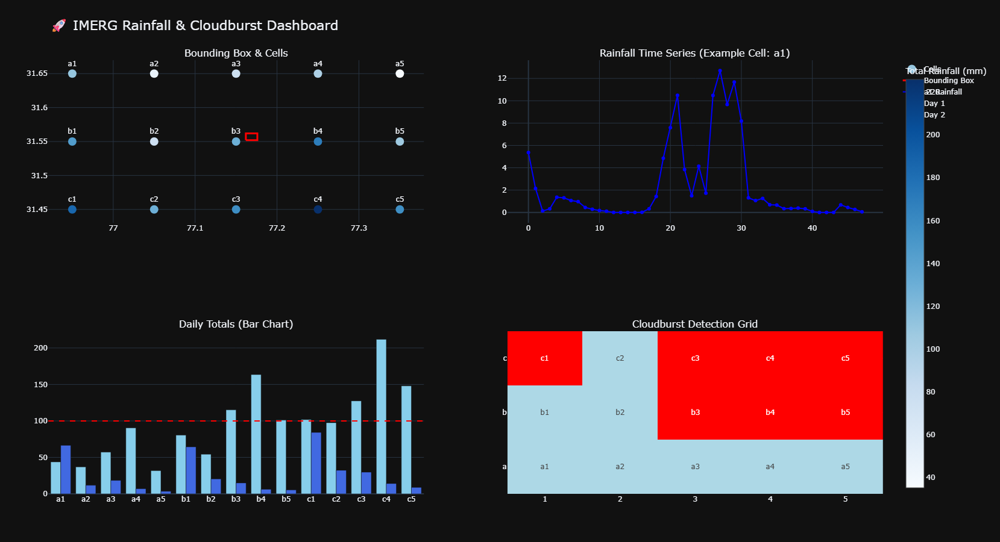

In [27]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

print("\n=== Step 9: Creating Interactive Dashboard ===")

# --------------------------
# 1. Data Prep
# --------------------------
df = df_cloudburst.copy()
df["Total_mm"] = df["Day1_mm"] + df["Day2_mm"]

rows = sorted(set([c[0] for c in df["cell_id"]]))
cols = sorted(set([int(c[1:]) for c in df["cell_id"]]))
grid_data = np.zeros((len(rows), len(cols)))

for i, r in enumerate(rows):
    for j, c in enumerate(cols):
        cid = f"{r}{c}"
        rec = df[df["cell_id"] == cid].iloc[0]
        grid_data[i, j] = 1 if rec["Any_Cloudburst"] else 0

# --------------------------
# 2. Create Subplots Layout
# --------------------------
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=("Bounding Box & Cells",
                    "Rainfall Time Series (Example Cell: a1)",
                    "Daily Totals (Bar Chart)",
                    "Cloudburst Detection Grid"),
    specs=[[{"type": "scatter"}, {"type": "xy"}],
           [{"type": "xy"}, {"type": "heatmap"}]]
)

# --------------------------
# 3. Map of Cells + Bounding Box
# --------------------------
# Cell centers (mock lat/lon grid using min/max from earlier records)
lons = [r["lon_center"] for r in records]
lats = [r["lat_center"] for r in records]
cids = [r["cell_id"] for r in records]

fig.add_trace(
    go.Scatter(
        x=lons, y=lats, mode="markers+text",
        text=cids, textposition="top center",
        marker=dict(size=14, color=df["Total_mm"], colorscale="Blues", showscale=True,
                    colorbar=dict(title="Total Rainfall (mm)")),
        name="Cells"
    ),
    row=1, col=1
)

# Bounding box overlay
bbox = [77.161956, 31.551969, 77.175989, 31.562025]
fig.add_trace(
    go.Scatter(
        x=[bbox[0], bbox[2], bbox[2], bbox[0], bbox[0]],
        y=[bbox[1], bbox[1], bbox[3], bbox[3], bbox[1]],
        mode="lines", line=dict(color="red", width=3),
        name="Bounding Box"
    ),
    row=1, col=1
)

# --------------------------
# 4. Example Time Series (cell a1)
# --------------------------
ts_a1 = np.nan_to_num(np.array(series_dict["a1"], dtype=float), nan=0.0)
fig.add_trace(
    go.Scatter(y=ts_a1, mode="lines+markers", name="a1 Rainfall",
               line=dict(color="blue")),
    row=1, col=2
)

# --------------------------
# 5. Daily Totals (Bar Chart)
# --------------------------
fig.add_trace(
    go.Bar(x=df["cell_id"], y=df["Day1_mm"], name="Day 1", marker_color="skyblue"),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=df["cell_id"], y=df["Day2_mm"], name="Day 2", marker_color="royalblue"),
    row=2, col=1
)

# Add cloudburst threshold line
fig.add_hline(y=100, line_dash="dash", line_color="red", row=2, col=1)

# --------------------------
# 6. Cloudburst Detection Grid (Heatmap)
# --------------------------
fig.add_trace(
    go.Heatmap(
        z=grid_data,
        x=cols, y=rows,
        colorscale=[(0, "lightblue"), (1, "red")],
        showscale=False,
        text=[[f"{r}{c}" for c in cols] for r in rows],
        texttemplate="%{text}"
    ),
    row=2, col=2
)

# --------------------------
# 7. Layout Styling
# --------------------------
fig.update_layout(
    title="🚀 IMERG Rainfall & Cloudburst Dashboard",
    title_font_size=22,
    showlegend=True,
    height=900,
    width=1200,
    template="plotly_dark"
)

fig.show()



=== Step 9: Creating Interactive Dashboard ===


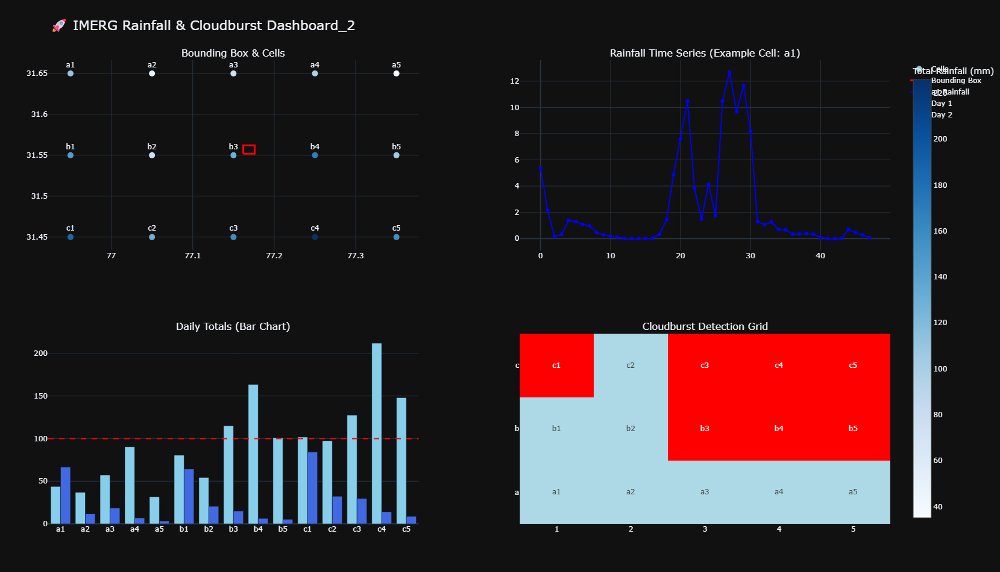

In [37]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

print("\n=== Step 9: Creating Interactive Dashboard ===")

# --------------------------
# 1. Data Prep
# --------------------------
df = df_cloudburst.copy()
df["Total_mm"] = df["Day1_mm"] + df["Day2_mm"]

rows = sorted(set([c[0] for c in df["cell_id"]]))
cols = sorted(set([int(c[1:]) for c in df["cell_id"]]))
grid_data = np.zeros((len(rows), len(cols)))

for i, r in enumerate(rows):
    for j, c in enumerate(cols):
        cid = f"{r}{c}"
        rec = df[df["cell_id"] == cid].iloc[0]
        grid_data[i, j] = 1 if rec["Any_Cloudburst"] else 0

# --------------------------
# 2. Create Subplots Layout
# --------------------------
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=("Bounding Box & Cells",
                    "Rainfall Time Series (Example Cell: a1)",
                    "Daily Totals (Bar Chart)",
                    "Cloudburst Detection Grid"),
    specs=[[{"type": "scatter"}, {"type": "xy"}],
           [{"type": "xy"}, {"type": "heatmap"}]],
    vertical_spacing=0.18,
    horizontal_spacing=0.12
)

# --------------------------
# 3. Map of Cells + Bounding Box
# --------------------------

# Use records to extract geometry (lon/lat centers)
lons = [r["lon_center"] for r in records]
lats = [r["lat_center"] for r in records]
cids = [r["cell_id"] for r in records]

fig.add_trace(
    go.Scatter(
        x=lons, y=lats, mode="markers+text",
        text=cids, textposition="top center",
        marker=dict(
            size=10,
            color=df["Total_mm"],  # from df
            colorscale="Blues",
            showscale=True,
            colorbar=dict(title="Total Rainfall (mm)")
        ),
        name="Cells"
    ),
    row=1, col=1
)

# Bounding box overlay
bbox = [77.161956, 31.551969, 77.175989, 31.562025]
fig.add_trace(
    go.Scatter(
        x=[bbox[0], bbox[2], bbox[2], bbox[0], bbox[0]],
        y=[bbox[1], bbox[1], bbox[3], bbox[3], bbox[1]],
        mode="lines",
        line=dict(color="red", width=3),
        name="Bounding Box"
    ),
    row=1, col=1
)

# --------------------------
# 4. Example Time Series (cell a1)
# --------------------------
ts_a1 = np.nan_to_num(np.array(series_dict["a1"], dtype=float), nan=0.0)
fig.add_trace(
    go.Scatter(y=ts_a1, mode="lines+markers", name="a1 Rainfall",
               line=dict(color="blue")),
    row=1, col=2
)

# --------------------------
# 5. Daily Totals (Bar Chart)
# --------------------------
fig.add_trace(
    go.Bar(x=df["cell_id"], y=df["Day1_mm"], name="Day 1", marker_color="skyblue"),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=df["cell_id"], y=df["Day2_mm"], name="Day 2", marker_color="royalblue"),
    row=2, col=1
)

# Add cloudburst threshold line
fig.add_hline(y=100, line_dash="dash", line_color="red", row=2, col=1)

# --------------------------
# 6. Cloudburst Detection Grid (Heatmap)
# --------------------------
fig.add_trace(
    go.Heatmap(
        z=grid_data,
        x=cols, y=rows,
        colorscale=[(0, "lightblue"), (1, "red")],
        showscale=False,
        text=[[f"{r}{c}" for c in cols] for r in rows],
        texttemplate="%{text}"
    ),
    row=2, col=2
)

# --------------------------
# 7. Layout Styling
# --------------------------
fig.update_layout(
    title="🚀 IMERG Rainfall & Cloudburst Dashboard_2",
    title_font_size=22,
    showlegend=True,
    height=950,
    width=1300,
    template="plotly_dark"
)

fig.show()


In [38]:
import chart_studio
import chart_studio.plotly as py
chart_studio.tools.set_credentials_file(username="***************", api_key="*********************")

py.plot(fig, filename="IMERG_Cloudburst_Dashboard_2", auto_open=True)


'https://chart-studio.plotly.com/~Sayantan_PhD/3/'